# Environmental sound classification using ANN and Random Forest

The ANN and Random Forest model has been used in this project to classify the sound that may be used for crime scene investigations and can protect many individuals from criminal actions. The datasets on the given problem is provided by my professors Dr. Paul Fergus. Furthermore, a comparison of the two models has been done in order to assess how well this model performs.

## The Data

The dataset contains around 8732 short audio recordings containing different sounds for creating an ML/DL model to detect crimes in the nearby region. UrbanSound8k is the dataset utilised here. An urban soundscape composed of 8732 tagged sound clips with a duration of less than or equal to 4 seconds in this dataset, which includes sounds such as air conditioners, automobile horns and jackhammers, as well as children playing and dogs barking. All the audio files are in WAV format. Below table shows the dataset classes, as well as the overall time of classes in seconds and the quantity of sound files that every class has:

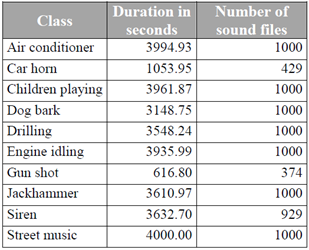

Since I am going to use Librosa which is not present in the 7146 environment. I am going to install librosa package using 'pip install librosa' which provides building blocks necessary to create music information retrieval systems. Librosa is a python package for music and audio analysis. It is commonly used for audio signal processing because of the given reasons:

1. It helps to converge the signal to mono.
2. It can represent an audio signal with respect to normalize pattern between -1 and 1 so that regular pattern is observed from all the audio.
3. It is able to see sample rate and by default it converts it into 22050 Hz. 




In [1]:
# Importing all the necessary/required libraries

# Importing librosa for extracting features
import librosa, librosa.display  
import numpy as np; print('Numpy: ',np.__version__)
import pandas as pd; print('Panda: ',pd.__version__)
import os
# To display audio controls in the frontend
import IPython.display as ipd

import sklearn
import tensorflow as tf; print('Tensorflow:',tf.__version__)
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Dense, Dropout, Activation
from tensorflow.keras.optimizers import Adam
from sklearn.ensemble import RandomForestClassifier as RFC
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
# To create progress meters or progress bars
from tqdm import tqdm 
# To read and write data from audio file format
from scipy.io import wavfile as wav
import matplotlib.pyplot as plt
%matplotlib inline

Numpy:  1.19.1
Panda:  1.2.4
Tensorflow: 2.2.0


## 1. Preprocessing and Exploratory Data Analysis (EDA)
Let's display one of the audio file in the form of signals

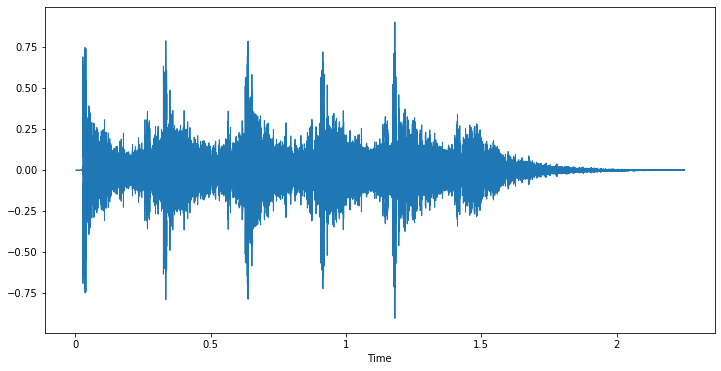

In [2]:
# Path of the audio file that is going to be used (gun shots)
audiopath = './audio/fold1/7061-6-0-0.wav'

# Plotting the figure with given figure size
plt.figure(figsize=(12,6))

# Loading the audio file through librosa as a floating point time series
# where sr is sampling rate and audio is resample to 22050 Hz which is the default value
data, sr = librosa.load(audiopath)

# For displaying the waveform of an audio file to see how it is being generated
librosa.display.waveshow(data, sr=sr)

# Helps to create an audio object
ipd.Audio(audiopath) 

Audio can have two channels which is "mono" and "stereo". 
In mono both the signals will be equally reaching to the ear.
In stereo some of the different signal can come to right side and some in the left.
Also an audio can have different sampling rate. 

Therefore, librosa will help to normalize the entire dataset and will give the data with respect to single sample rate and also helps in converting audio from stereo channel to mono channel. 

Now let's check the original sampling rate of the audio file to see that it has been resampled to 22050 Hz.

In [3]:
# To check the original sampling rate of the audio file
wave_sr, wave_audio = wav.read(audiopath)
wave_sr

44100

In [4]:
# For checking the value of sampling rate after loading through librosa
sr

22050

In [5]:
# 'wave_audio' is the original form of numerical values of an audio file
# It can be seen that it was an stereo signal because of 2d array
wave_audio

array([[0, 0],
       [0, 0],
       [0, 0],
       ...,
       [1, 0],
       [1, 1],
       [0, 0]], dtype=int16)

In [6]:
# With the help of librosa, it is the normalized form of numerical value of an audio file
# between -1 to 1.
data

array([0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 1.0231203e-05,
       2.3116412e-05, 0.0000000e+00], dtype=float32)

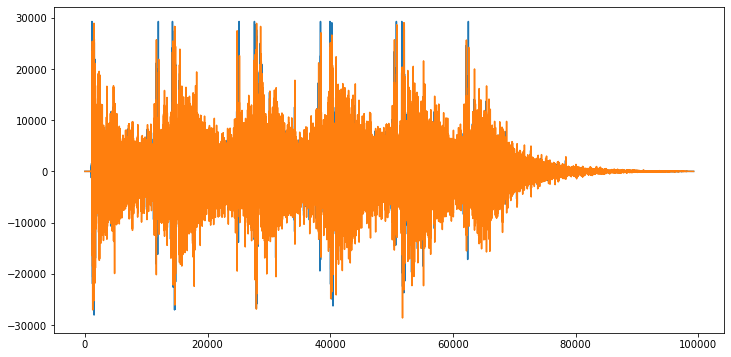

In [7]:
# To see the audio waves with 2 channels (stereo)
plt.figure(figsize=(12,6))
plt.plot(wave_audio)

Lets read the metada file that is given in the dataset which contain the following information:

1. slice_file_name = name of the audio file
2. fsID = freesound ID of the recording from which this excerpt (slice) is taken
3. start = start time of the slice in the original freesound recording
4. end = end time of slice in the original freesound recording
5. salience = salience rating of the sound: 1 = foreground, 2 = background
6. fold = folder in which the audio file belongs to
7. classID = it is the numerical id given to each class 
8. class = the class that audio file belongs to

In [8]:
# Lets read the given metadata file from the dataset
mtdata = pd.read_csv('./metadata/UrbanSound8K.csv')

# Lets check the information present in the file
mtdata.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


In [9]:
# To check dataset whether it is imbalanced or not. Or to see whether we have enough 
# data for the classes that we are going to use
mtdata['class'].value_counts()

engine_idling       1000
air_conditioner     1000
dog_bark            1000
jackhammer          1000
street_music        1000
drilling            1000
children_playing    1000
siren                929
car_horn             429
gun_shot             374
Name: class, dtype: int64

### Extract features
Now we are going to take the audio signal waveform and will try to create some
independent features that represent particular audio signal. 
For this we are going to use librosa with Mel-Frequency Cepstral Coefficients (MFCC).
MFCC helps to extract some features from the audio samples. It summarises frequency distriburion across the window size, so it is possible to analyse both the frequency and time characteristics of the sound. These audio representation will allow us to identify features for classification.


In [10]:
# Example of a single audio file, here n_mfcc is the number of mfccs to return
mfcc = librosa.feature.mfcc(y=data, sr=sr, n_mfcc=40)
print(mfcc.shape)

(40, 97)


In [11]:
# Below are the patterns that has been extracted of one file based on the 
# frequency and time-chracteristics which will help in classificaion later
mfcc

array([[-1.2778429e+02,  7.4964671e+00,  1.5476106e+01, ...,
        -5.6935333e+02, -5.9172754e+02, -6.1065771e+02],
       [ 3.0827904e+01,  2.3719746e+01,  1.1416364e+01, ...,
         4.3051193e+01,  2.5888039e+01,  1.2829863e+01],
       [-3.3416867e+00, -1.2030355e+01, -1.5005075e+01, ...,
        -1.1103722e+01, -7.5506306e+00,  2.0151030e-01],
       ...,
       [ 6.1909270e-01, -3.2603278e+00, -4.7559180e+00, ...,
         2.4095776e+00,  3.1699710e+00, -2.1265179e-01],
       [-1.0057060e+01, -9.3599148e+00, -6.4467373e+00, ...,
        -5.0200164e-02,  7.2894961e-01, -9.0058064e-01],
       [ 1.9151618e+00,  2.0736120e+00,  3.0683596e+00, ...,
        -2.0609183e+00, -2.2312689e+00, -1.7745539e+00]], dtype=float32)

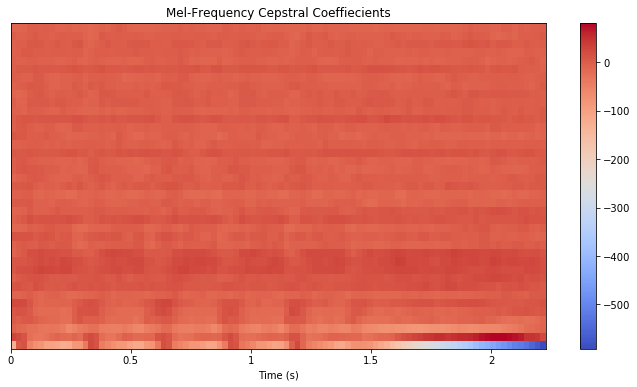

In [12]:
# Lets plot the MFCC of a single audio file
plt.figure(figsize=(12,6))
librosa.display.specshow(mfcc, x_axis="s")
plt.title("Mel-Frequency Cepstral Coeffiecients")
plt.colorbar()

In [13]:
# Extracting MFCC for every audio file

# Complete Dataset file path
dataset_path = './audio'

# Lets read the given metadata file from the dataset
mtdata = pd.read_csv('./metadata/UrbanSound8K.csv')

# Let's check the information present in the file
mtdata.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


Creating feature extractor function which takes a filename. Inside function I am going to use librosa.load from file to take out two information (audio and sample rate). Then I am going to use mfcc to extract feature. In order to find scaled features I am going to mean on transpose of the particular value.

In [14]:
# Creating feature extractor function for single audio file
def ftrs_extractor(file):
    data, sr = librosa.load(file_name, res_type='kaiser_fast')
    mfcc_ftrs = librosa.feature.mfcc(y=data, sr=sr, n_mfcc=80)
    
    # In order to find out the scaled feature
    mfcc_scaled_ftrs = np.mean(mfcc_ftrs.T, axis=0)
    
    return mfcc_scaled_ftrs

In order to extract features like above for all the audio files, I am going to iterate the above function through metadata csv file. I am using MFCC because it helps to extract important information based on frequency and time data.

In [15]:
# To iterate through every audio file and extract features using MFCC
extracted_ftrs = []
for index, row in tqdm(mtdata.iterrows()):
    # For accesing the audio file in the path
    file_name = os.path.join(os.path.abspath(dataset_path), 'fold'+str(row["fold"])+
                          '/', str(row["slice_file_name"]))
    
    # After getting file name then we are going to get class of it
    # to see which class that audio belongs to
    final_class_lbls = row["class"]
    
    # Storing the extracted features in data variable
    data = ftrs_extractor(file_name)
    
    # Appending the extracted data in the list created above later will be converted in 
    # dataframe
    extracted_ftrs.append([data, final_class_lbls])

3554it [03:38, 16.84it/s]/home/msc1/anaconda3/envs/Env-7146COMP/lib/python3.7/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=2048 is too small for input signal of length=1323
  return f(*args, **kwargs)
8325it [08:25, 21.78it/s]/home/msc1/anaconda3/envs/Env-7146COMP/lib/python3.7/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=2048 is too small for input signal of length=1103
  return f(*args, **kwargs)
/home/msc1/anaconda3/envs/Env-7146COMP/lib/python3.7/site-packages/librosa/util/decorators.py:88: UserWarning: n_fft=2048 is too small for input signal of length=1523
  return f(*args, **kwargs)
8732it [08:48, 16.52it/s]


In [16]:
# Converting extracted_features into Pandas dataframe
extracted_ftrs_df = pd.DataFrame(extracted_ftrs, columns=['feature','class'])
extracted_ftrs_df.head()

,feature,class
0,"[-218.18938, 71.38549, -131.49442, -52.25892, ...",dog_bark
1,"[-425.05234, 110.67095, -54.192833, 62.045414,...",children_playing
2,"[-459.82623, 122.82864, -47.908062, 53.302677,...",children_playing
3,"[-414.82184, 102.94826, -36.65685, 54.170742, ...",children_playing
4,"[-447.60776, 115.08627, -53.74607, 61.55309, 1...",children_playing


In [17]:
# To check audio classes
data_classes = mtdata.groupby('classID')['class'].unique()
data_classes

classID
0     [air_conditioner]
1            [car_horn]
2    [children_playing]
3            [dog_bark]
4            [drilling]
5       [engine_idling]
6            [gun_shot]
7          [jackhammer]
8               [siren]
9        [street_music]
Name: class, dtype: object

In [18]:
# Split the dataset into independent and dependent dataset
X = np.array(extracted_ftrs_df['feature'].tolist())
y = np.array(extracted_ftrs_df['class'].tolist())

In [19]:
# To check the shape of the X and y
X.shape, y.shape

((8732, 80), (8732,))

In [20]:
# Doing label encoding (0 = dog_bark, 1 = children_playing and so on) 
# To get back the class name using inverse label encoder
label_encoder = LabelEncoder()
y = to_categorical(label_encoder.fit_transform(y))

In [21]:
# Lets check y shape again
y.shape

(8732, 10)

In [22]:
# splitting the train test data into 80/20 split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [23]:
# Checking shape of the training data
X_train.shape, X_test.shape

((6985, 80), (1747, 80))

In [ ]:
# Checking the shape of the testing data
y_train.shape, y_test.shape

((6985, 10), (1747, 10))

### Model creation

In [26]:
# Number of classes
num_classes=y.shape[1]
num_classes

10

In [27]:
%%time
# Creating an ANN with 3 dense layers

model=Sequential()

# First layer
model.add(Dense(300,input_shape=(80,)))
model.add(Activation('relu'))
model.add(Dropout(0.5))
# Second layer
model.add(Dense(200))
model.add(Activation('relu'))
model.add(Dropout(0.5))
# Third layer
model.add(Dense(100))
model.add(Activation('relu'))
model.add(Dropout(0.5))

# Final output layer
model.add(Dense(num_classes))
model.add(Activation('softmax')) # softmax because it is a multiclass classification prob.

CPU times: user 60.5 ms, sys: 9.36 ms, total: 69.8 ms
Wall time: 68.3 ms


In [28]:
# Lets see the summary of the created model
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 300)               24300     
_________________________________________________________________
activation_3 (Activation)    (None, 300)               0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 300)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 200)               60200     
_________________________________________________________________
activation_4 (Activation)    (None, 200)               0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 200)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 100)              

In [29]:
# Compiling the model
model.compile(loss='categorical_crossentropy',metrics=['accuracy'],optimizer='adam')

In [30]:
%%time
# training the model
num_epochs = 300
batch_size = 32

# verbose 1 to see the progress bar of the training
training_model = model.fit(X_train, y_train, batch_size=batch_size, epochs=num_epochs,
                           validation_data=(X_test, y_test), verbose=1)

Epoch 1/300


2022-04-16 19:47:15.202935: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10


219/219 [==============================] - 1s 2ms/step - loss: 7.9453 - accuracy: 0.1313 - val_loss: 2.2781 - val_accuracy: 0.1643
Epoch 2/300
219/219 [==============================] - 0s 1ms/step - loss: 2.4917 - accuracy: 0.1519 - val_loss: 2.2236 - val_accuracy: 0.1431
Epoch 3/300
219/219 [==============================] - 0s 1ms/step - loss: 2.2650 - accuracy: 0.1629 - val_loss: 2.1339 - val_accuracy: 0.2164
Epoch 4/300
219/219 [==============================] - 0s 1ms/step - loss: 2.1639 - accuracy: 0.2082 - val_loss: 2.0231 - val_accuracy: 0.2330
Epoch 5/300
219/219 [==============================] - 0s 1ms/step - loss: 2.0768 - accuracy: 0.2299 - val_loss: 1.9473 - val_accuracy: 0.3246
Epoch 6/300
219/219 [==============================] - 0s 1ms/step - loss: 2.0359 - accuracy: 0.2533 - val_loss: 1.8911 - val_accuracy: 0.3440
Epoch 7/300
219/219 [==============================] - 0s 1ms/step - loss: 1.9689 - accuracy: 0.2796 - val_loss: 1.7932 - val_accuracy: 0.4024
Epoch 8/300

In [31]:
test_accuracy=model.evaluate(X_test,y_test,verbose=0)
print(test_accuracy[1])

0.9273039698600769


### Lets evaluate the ANN with 3 layers model to see how it performs

In [32]:
# To handle a mix of multilabel-indicator and continuous-multioutput targets
y_true = np.argmax(y_test,axis=1)

# To do prediction
y_pred = np.argmax(model.predict(X_test),axis=1)

# To print confusion matrix
print('\nConfusion Matrix :\n')
print(confusion_matrix(y_true,y_pred))

# To print classification report
print('\n\nClassification Report : \n')
print(classification_report(y_true,y_pred))


Confusion Matrix :

[[195   0   2   0   0   4   0   1   0   1]
 [  0  75   4   0   0   1   0   0   0   6]
 [  1   0 161  10   1   3   1   0   1   5]
 [  1   0  11 183   0   0   2   0   1   3]
 [  0   0   5   4 187   1   0   5   0   4]
 [  1   0   1   0   0 191   0   0   0   0]
 [  0   0   4   3   0   1  62   0   0   2]
 [  0   0   0   0   6   0   0 202   0   0]
 [  0   0   3   4   0   0   0   1 157   0]
 [  4   0  14   2   0   2   0   1   0 207]]


Classification Report : 

              precision    recall  f1-score   support

           0       0.97      0.96      0.96       203
           1       1.00      0.87      0.93        86
           2       0.79      0.88      0.83       183
           3       0.89      0.91      0.90       201
           4       0.96      0.91      0.94       206
           5       0.94      0.99      0.96       193
           6       0.95      0.86      0.91        72
           7       0.96      0.97      0.97       208
           8       0.99      0.95

In [33]:
# To check training history
training_hist = pd.DataFrame(training_model.history)
training_hist

,loss,accuracy,val_loss,val_accuracy
0,7.945264,0.131281,2.278139,0.164282
1,2.491729,0.151897,2.223640,0.143102
2,2.265034,0.162921,2.133898,0.216371
3,2.163884,0.208160,2.023084,0.232971
4,2.076796,0.229921,1.947273,0.324556
...,...,...,...,...
295,0.331158,0.904080,0.314302,0.928449
296,0.338757,0.900787,0.336567,0.922152
297,0.326673,0.905512,0.307507,0.926732
298,0.313522,0.906084,0.311851,0.925014


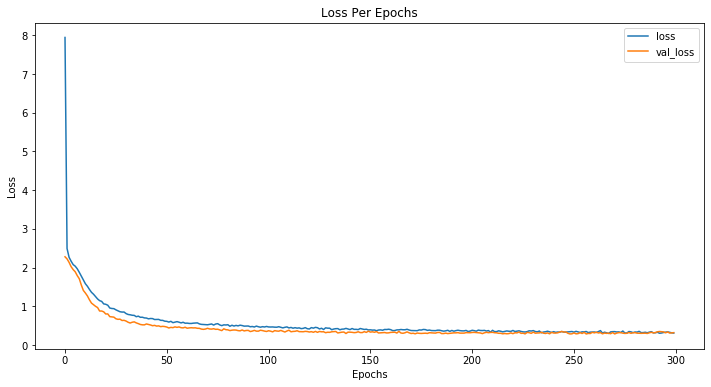

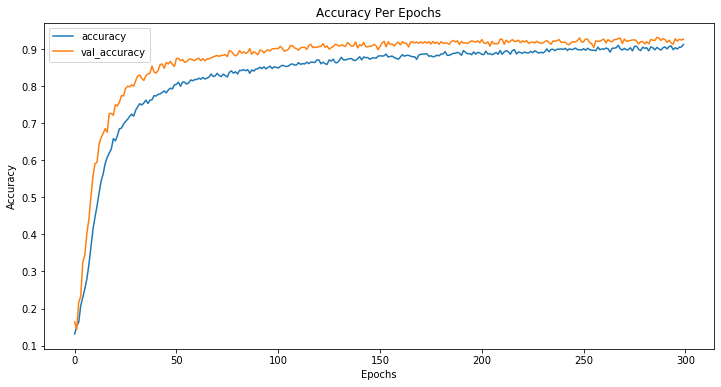

In [34]:
# Visualizing training history

#loss
plt.figure(figsize=(12,6))
plt.plot(training_hist[['loss','val_loss']])
plt.legend(['loss', 'val_loss'])
plt.title('Loss Per Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

# accuracy
plt.figure(figsize=(12,6))
plt.plot(training_hist[['accuracy','val_accuracy']])
plt.legend(['accuracy','val_accuracy'])
plt.title('Accuracy Per Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.show()

From above it can be seen that both training loss and validation loss are somehow similar that means it is neither overfitting or underfitting the data. 

Now, I am going to save the model in the .h5 format so that the inference can be performed on unseen or external audio files.

In [35]:
# saving the model in h5 format
model.save("./saved_model/model.h5")
print("Model has been saved")

Model has been saved


### Lets do the inferencing for ANN model using the saved model

In [36]:
# Importing keras to load model
from tensorflow import keras

# Loading the saved model
saved_model = keras.models.load_model("./saved_model/model.h5")

In [37]:
# Doing inferening with the external data with the help of saved model
# Creating a function so that an audio file can run on it to predict the sound
def audio_predict(audiopath):
    audio_data, sample_rate = librosa.load(audiopath, res_type='kaiser_fast') 
    mfccs_ftr = librosa.feature.mfcc(y=audio_data, sr=sample_rate, n_mfcc=80)
    mfccs_scaled_ftr = np.mean(mfccs_ftr.T,axis=0)
    
    mfccs_scaled_ftr = mfccs_scaled_ftr.reshape(1,-1)
    pred_vector = saved_model.predict_classes(mfccs_scaled_ftr)
    pred_class = label_encoder.inverse_transform(pred_vector)
    print("The predicted class is:", pred_class[0], '\n')
    return ipd.Audio(audiopath)

Let's take a look at how the model performs on the external audio files that I downloaded from the freesound.org website.

In [40]:
audio_predict('./inference_audio/child_play.wav')

The predicted class is: children_playing 



In [41]:
audio_predict('./inference_audio/air_condit.wav')

The predicted class is: air_conditioner 



In [43]:
audio_predict('./inference_audio/car_horn.wav')

The predicted class is: dog_bark 



In [44]:
audio_predict('./inference_audio/dog_bark.wav')

The predicted class is: dog_bark 



In [45]:
audio_predict('./inference_audio/drilling.wav')

The predicted class is: drilling 



In [46]:
audio_predict('./inference_audio/engine_idling.wav')

The predicted class is: engine_idling 



In [48]:
audio_predict('./inference_audio/gun_shots.wav')

The predicted class is: children_playing 



In [49]:
audio_predict('./inference_audio/jackhammer.wav')

The predicted class is: drilling 



In [50]:
audio_predict('./inference_audio/siren.wav')

The predicted class is: children_playing 



In [51]:
audio_predict('./inference_audio/street_music.wav')

The predicted class is: street_music 



## Performing Random Forest algorithm
Lets perform RF so that comparison can be made between two models

I tried by adjusting the following set of hyperparameters:

* n_estimators = number of trees in the foreset
* max_features = max number of features considered for splitting a node
* max_depth = max number of levels in each decision tree
* min_samples_split = min number of data points placed in a node before the node is split
* min_samples_leaf = min number of data points allowed in a leaf node
* bootstrap = method for sampling data points (with or without replacement)

But out of all these only n_estimators and max_depth were much effective to improve the accuracy for which I've given all the results in the summary below.

In [52]:
# To implement random forest classifier with 300 trees and a depth of 8
rf_classifier = RFC(n_estimators=300, max_depth=40)

In [60]:
%%time
# To train the dataset using RF model
rf_classifier.fit(X_train, y_train)

CPU times: user 19.1 s, sys: 0 ns, total: 19.1 s
Wall time: 19.1 s


RandomForestClassifier(max_depth=40, n_estimators=300)

In [61]:
# To check the accuracy of the model
rf_pred = rf_classifier.predict(X_test)
sklearn.metrics.accuracy_score(rf_pred, y_test)

0.6107613050944476

### Lets evaluate the Random Forest model to see how it performs

In [62]:
# To handle a mix of multilabel-indicator and continuous-multioutput targets
rf_true = np.argmax(y_test,axis=1)

# To do prediction
rf_pred = np.argmax(rf_classifier.predict(X_test),axis=1)

# To print confusion matrix
print('\nConfusion Matrix :\n')
print(confusion_matrix(rf_true,rf_pred))

# To print classification report
print('\n\nClassification Report : \n')
print(classification_report(rf_true,rf_pred))


Confusion Matrix :

[[203   0   0   0   0   0   0   0   0   0]
 [ 39  46   0   0   0   0   0   0   0   1]
 [118   0  65   0   0   0   0   0   0   0]
 [ 85   0   0 116   0   0   0   0   0   0]
 [ 84   0   0   0 119   0   0   3   0   0]
 [ 29   0   0   0   0 164   0   0   0   0]
 [ 23   0   0   2   0   0  47   0   0   0]
 [ 39   0   0   0   2   0   0 167   0   0]
 [ 39   0   0   1   0   0   0   0 125   0]
 [173   0   0   0   0   0   0   0   0  57]]


Classification Report : 

              precision    recall  f1-score   support

           0       0.24      1.00      0.39       203
           1       1.00      0.53      0.70        86
           2       1.00      0.36      0.52       183
           3       0.97      0.58      0.72       201
           4       0.98      0.58      0.73       206
           5       1.00      0.85      0.92       193
           6       1.00      0.65      0.79        72
           7       0.98      0.80      0.88       208
           8       1.00      0.76

Now, I am going to save the model in the .joblib format which is for saving RF model. After saving the model the inference can be performed on unseen or external audio files.

In [63]:
# Importing joblib to save RF model
import joblib

# saving the RF model
joblib.dump(rf_classifier, "./saved_model/rf_model.joblib")
print("Model has been saved")

Model has been saved


In [65]:
# Loading the saved model
saved_rf_model = joblib.load("./saved_model/rf_model.joblib")

In [73]:
# Doing inferening with the external data with the help of saved model
# Creating a function so that an audio file can run on it to predict the sound
def audio_rf_predict(audiopath):
    audio_data, sample_rate = librosa.load(audiopath, res_type='kaiser_fast') 
    mfccs_ftr = librosa.feature.mfcc(y=audio_data, sr=sample_rate, n_mfcc=80)
    mfccs_scaled_ftr = np.mean(mfccs_ftr.T,axis=0)
    
    mfccs_scaled_ftr = mfccs_scaled_ftr.reshape(1,-1)
    pred_vector = np.argmax(saved_rf_model.predict(mfccs_scaled_ftr), axis=1)
    pred_class = label_encoder.inverse_transform(pred_vector)
    print("The predicted class is:", pred_class[0], '\n')
    return ipd.Audio(audiopath)

In [74]:
audio_rf_predict('./inference_audio/child_play.wav')

The predicted class is: children_playing 



In [75]:
audio_rf_predict('./inference_audio/air_condit.wav')

The predicted class is: air_conditioner 



In [76]:
audio_rf_predict('./inference_audio/car_horn.wav')

The predicted class is: air_conditioner 



In [77]:
audio_rf_predict('./inference_audio/dog_bark.wav')

The predicted class is: dog_bark 



In [78]:
audio_rf_predict('./inference_audio/drilling.wav')

The predicted class is: drilling 



In [79]:
audio_rf_predict('./inference_audio/engine_idling.wav')

The predicted class is: air_conditioner 



In [80]:
audio_rf_predict('./inference_audio/gun_shots.wav')

The predicted class is: air_conditioner 



In [81]:
audio_rf_predict('./inference_audio/jackhammer.wav')

The predicted class is: air_conditioner 



In [82]:
audio_rf_predict('./inference_audio/siren.wav')

The predicted class is: air_conditioner 



In [83]:
audio_rf_predict('./inference_audio/street_music.wav')

The predicted class is: air_conditioner 



While doing inference on ten unknown test audio files in both the models, it can be noted that a total of six audio files were accurately predicted using ANN model, whereas only 4 external audio files were correctly predicted using RF model where the length of the audio clip was less than four seconds. 

The reason for incorrect prediction in 'car horn' and 'gun shot' is that we only have a small amount of audio recordings to train for these two classes compared to other classes. The number of training data for various classes is shown below:

1. engine_idling   ->    1000
2. air_conditioner   ->  1000
3. dog_bark          ->  1000
4. jackhammer        ->  1000
5. street_music    ->    1000
6. drilling        ->    1000
7. children_playing  ->  1000
8. siren           ->     929
9. car_horn       ->      429
10. gun_shot      ->       374

Also, another thing that can be seen is that the saved model of ANN, which is in.h5 format, has a size of 1.3 megabytes, whereas the saved model of RF, which is in.joblib format, has a size of 150.6 megabytes, which is much larger than the saved model of ANN.

## Summary/Conclusion

Based on accuracy and evaluation section, it is clear that ANN outperforms RF in terms of accuracy. But, RF outperforms ANN in terms of training time. However, because the accuracy of ANN is so much higher, training time does not appear to be a significant issue. The benchmarks or the output of different parameters that I have tried for both models are shown below (ANN and RF).

### ANN model

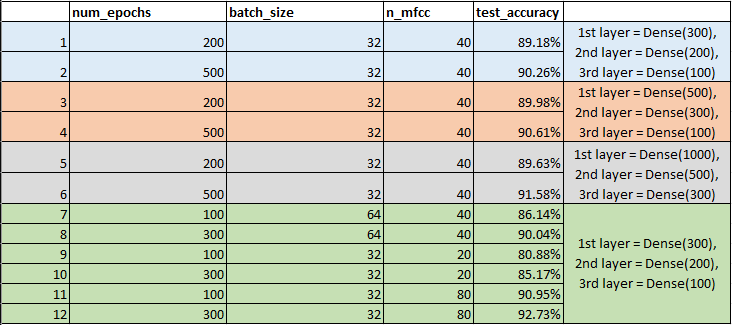

### RF Model

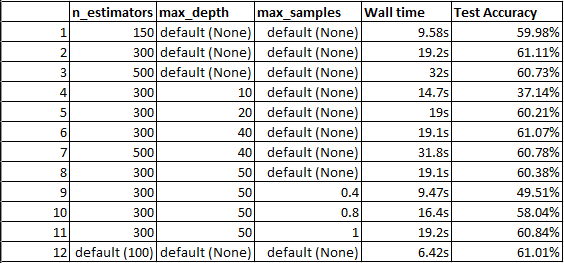

According to the above benchmark, the MLP model performs the best with an accuracy of 92.73% when the number of epochs is 300, the batch size is 32, and the n mfcc is 80 in the scenario where the density of the first, second, and third layers is 300, 200, and 100, respectively. Similarly, in the RF model, the parameter with the best accuracy of 61.11% when n estimator or number of trees is 300, max depth, and max samples are set to their default values. It also concludes that neural networks outperform RF in terms of accuracy when the input dataset contains audio.

I also attempted the 1DCNN model, however it requires three-dimensional input (samples, time steps, and features), which requires reshaping the training and testing data. But even after reshapaing and everything, I was still facing error after error, which took a lot of time. As a result, in order to save time for other coursework, I decided not to use this model. This can be done in future work to evaluate how it compares to the two models presented above.

### Reasons for the selected model parameters

To determine the ideal parameters, I started with one parameter, such as the number of trees in RF, and gradually increased the number of trees to check if there was any gain in accuracy. Then, after choosing the optimum number of trees, I begin with another parameter starting with low values to determine which value helps to raise the accuracy, and so on. For training and testing split, I trained the model with several splits of training and testing data, such as 90/10, 70/30, and 95/5, however the 80/20 split performed better than the other splits.

I attempted and ran many various parameters, but only a few perimeters comparisons are presented in the comparison table or image above since the accuracy that other parameters provided when I used them was not good enough or better than the ones I selected. Also, the table would be excessively long as some of the parameters made accuracy poorer which wasn't worth it. However, I have highlighted a couple of the values where the performance was particularly bad, such as 37% or 49%, to demonstrate the variety of outcomes that I obtained with different parameters. 

## Thank you